# Searching Image from stylegan generator by inputing text prompt with the help of CLIP


Code is borrowed heavily from nagolinc's notebook https://github.com/nagolinc/notebooks/blob/main/CLIP_%2B_TADNE_(pytorch)_v2.ipynb

Make sure you have choosen gpu runtime

In [ ]:
!nvidia-smi -L

!git clone https://github.com/levindabhi/stylegan2-pytorch.git
%cd /content/stylegan2-pytorch

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-df700fd9-5fdc-e4b2-2bb5-54b3462ef9bb)
Cloning into 'stylegan2-pytorch'...
remote: Enumerating objects: 352, done.
remote: Total 352 (delta 0), reused 0 (delta 0), pack-reused 352
Receiving objects: 100% (352/352), 122.50 MiB | 11.36 MiB/s, done.
Resolving deltas: 100% (175/175), done.
/content/stylegan2-pytorch


## Please change your stylegan/ada pkl file link and name below

In [ ]:
import gdown, os

url = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl'
output_path = 'ffhq.pkl'
if not os.path.exists(output_path):
    gdown.download(url, output_path, quiet=False)

!git clone https://github.com/NVlabs/stylegan2-ada.git

Downloading...
From: https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl
To: /content/stylegan2-pytorch/ffhq.pkl
100%|██████████| 382M/382M [00:01<00:00, 195MB/s]


Cloning into 'stylegan2-ada'...
remote: Enumerating objects: 65, done.
remote: Total 65 (delta 0), reused 0 (delta 0), pack-reused 65
Unpacking objects: 100% (65/65), done.


In [ ]:
!pip install ninja

import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

! pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

     |████████████████████████████████| 112kB 15.5MB/s 
CUDA version: 10.1
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 735.4MB 24kB/s 
     |████████████████████████████████| 12.8MB 243kB/s 
     |████████████████████████████████| 71kB 4.7MB/s 
  Created wheel for ftfy: filename=ftfy-5.8-cp36-none-any.whl size=45613 sha256=2a628965cec5c21cfce6038e00e7ca00eee83fea9a8e374400278b72b5676d87
  Stored in directory: /root/.cache/pip/wheels/ba/c0/ef/f28c4da5ac84a4e06ac256ca9182fc34fa57fefffdbc68425b
Successfully built ftfy
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101


TensorFlow 1.x selected.
Setting up TensorFlow plugin "fused_bias_act.cu": Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Compiling... Loading... Done.


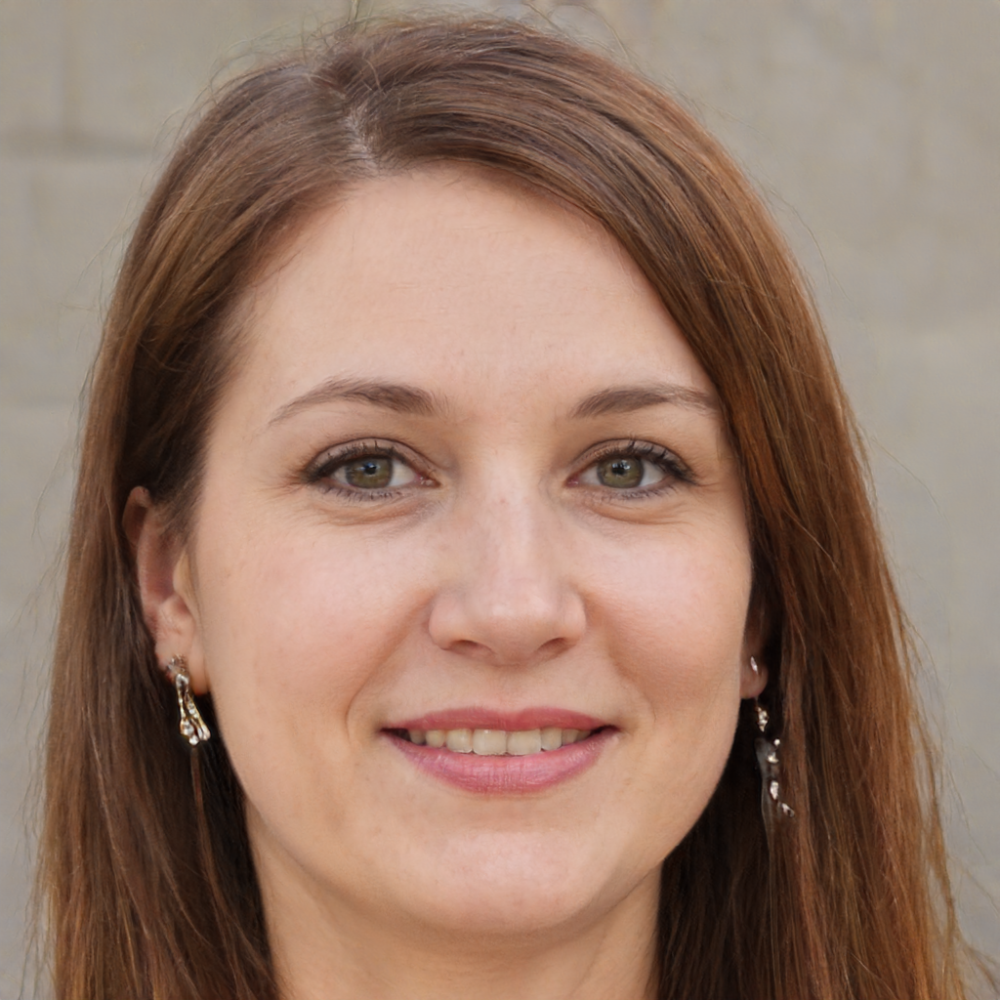

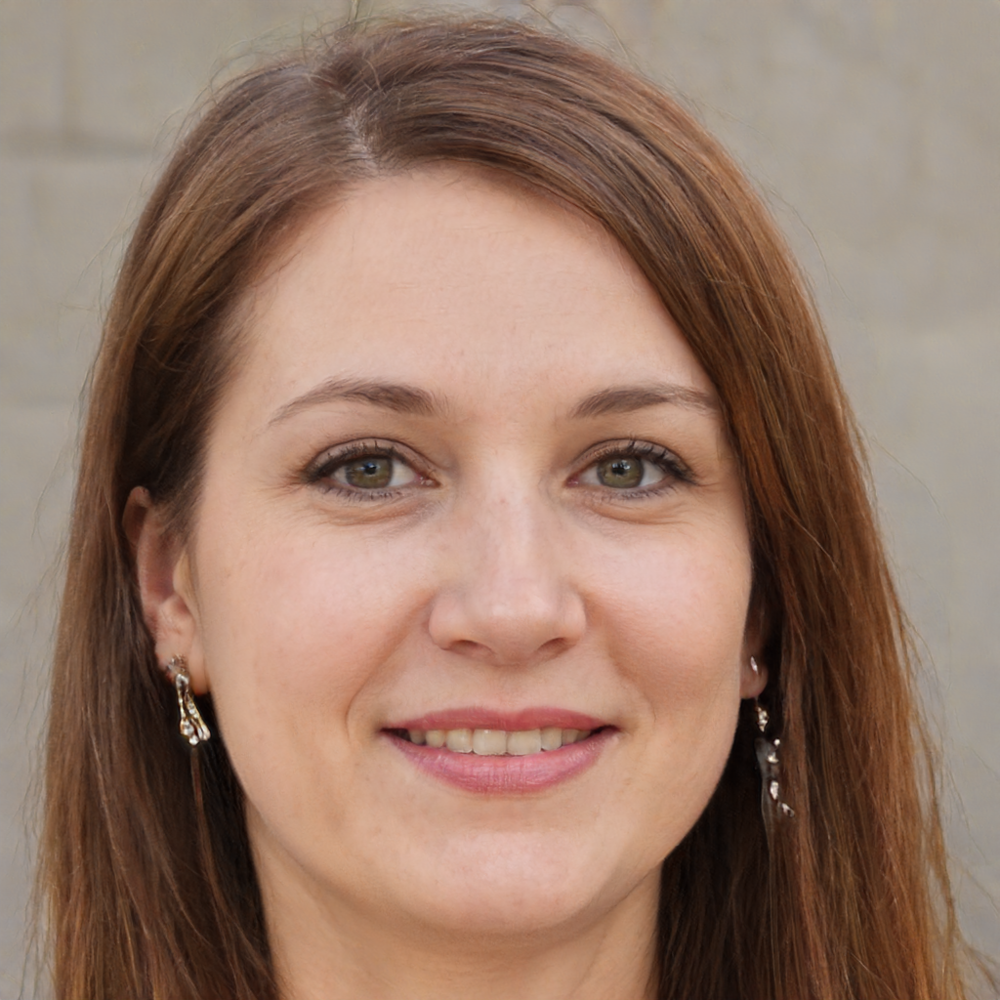

In [ ]:
%tensorflow_version 1.x
import PIL 
from PIL import Image

import argparse
import os
import sys
import pickle
import math

import torch
import numpy as np
from torchvision import utils

from model import Generator, Discriminator
from convert_weight import convert_modconv, convert_conv, convert_torgb, convert_dense, update, discriminator_fill_statedict, fill_statedict

class parser():
    def __init__(self):
        self.repo = 'stylegan2-ada'
        self.gen = False
        self.disc = False
        self.channel_multiplier = 2
        self.path = None

args = parser()

args.repo = 'stylegan2-ada'
args.gen = True
args.disc = True
args.path = output_path
sys.path.append(args.repo)

import dnnlib
from dnnlib import tflib

tflib.init_tf()

with open(args.path, "rb") as f:
    generator, discriminator, g_ema = pickle.load(f)
    Gs = g_ema
    _D = discriminator
    _G = generator

size = g_ema.output_shape[2]

n_mlp = 0
mapping_layers_names = g_ema.__getstate__()['components']['mapping'].list_layers()
for layer in mapping_layers_names:
    if layer[0].startswith('Dense'):
        n_mlp += 1

g = Generator(size, 512, n_mlp, channel_multiplier=args.channel_multiplier)
state_dict = g.state_dict()
state_dict = fill_statedict(state_dict, g_ema.vars, size, n_mlp)

g.load_state_dict(state_dict)

latent_avg = torch.from_numpy(g_ema.vars["dlatent_avg"].value().eval())

ckpt = {"g_ema": state_dict, "latent_avg": latent_avg}

if args.gen:
    g_train = Generator(size, 512, n_mlp, channel_multiplier=args.channel_multiplier)
    g_train_state = g_train.state_dict()
    g_train_state = fill_statedict(g_train_state, generator.vars, size, n_mlp)
    ckpt["g"] = g_train_state

if args.disc:
    disc = Discriminator(size, channel_multiplier=args.channel_multiplier)
    d_state = disc.state_dict()
    d_state = discriminator_fill_statedict(d_state, discriminator.vars, size)
    ckpt["d"] = d_state
    disc.load_state_dict(d_state)

# name = os.path.splitext(os.path.basename(args.path))[0]
# torch.save(ckpt, name + ".pt")

device='cuda'

n_sample = 1
g = g.to(device)

inputSize=1024
z = np.random.RandomState(0).randn(n_sample, 512).astype("float32")

with torch.no_grad():
    img_pt, _ = g(
        [torch.from_numpy(z).to(device)],
        truncation=0.5,
        truncation_latent=latent_avg.to(device),
        randomize_noise=False,
    )

Gs_kwargs = dnnlib.EasyDict()
Gs_kwargs.randomize_noise = False
img_tf = g_ema.run(z, None, **Gs_kwargs)
img_tf = torch.from_numpy(img_tf).to(device)

def fmtImg(r):
    img = ((r+1)/2*256).clip(0,255).astype(np.uint8).transpose(1,2,0)
    return PIL.Image.fromarray(img, 'RGB')

#verify that everthing is working fine and these images match
img=img_pt.cpu().numpy()[0]
display(fmtImg(img))
img = img_tf.cpu().numpy()[0]
display(fmtImg(img))

In [ ]:
#and do we get the same output for D and disc?

img=img_tf.cpu().numpy()
score0=_D.run(img,None)
disc.to(device)
with torch.no_grad():
    score1 = disc(
          torch.from_numpy(img).to(device)
    )
#verify that these scores match
print(score0,score1)

[[-4.190577]] tensor([[-4.1906]], device='cuda:0')


#Import CLIP

In [ ]:
MODELS = {
    "ViT-B/32":       "https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt",
}

! wget {MODELS["ViT-B/32"]} -O model.pt

model = torch.jit.load("model.pt").cuda().eval()
input_resolution = model.input_resolution.item()
context_length = model.context_length.item()
vocab_size = model.vocab_size.item()

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

--2021-01-28 15:16:48--  https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.246.13, 2620:1ec:bdf::13
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.246.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 353976522 (338M) [application/octet-stream]
Saving to: ‘model.pt’

model.pt            100%[===================>] 337.58M  59.5MB/s    in 5.8s    

2021-01-28 15:16:54 (58.5 MB/s) - ‘model.pt’ saved [353976522/353976522]

Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


## Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.



In [ ]:
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from PIL import Image

preprocess = Compose([
    Resize(input_resolution, interpolation=Image.BICUBIC),
    CenterCrop(input_resolution),
    ToTensor()
])

image_mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).cuda()
image_std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).cuda()

## Text Preprocessing

We use a case-insensitive tokenizer. The tokenizer code is hidden in the second cell below

In [ ]:
! pip install ftfy regex
! wget https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz -O bpe_simple_vocab_16e6.txt.gz

!git clone https://github.com/openai/CLIP.git
from CLIP.clip.simple_tokenizer import SimpleTokenizer

--2021-01-28 15:19:43--  https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz
Resolving openaipublic.azureedge.net (openaipublic.azureedge.net)... 13.107.246.13, 2620:1ec:bdf::13
Connecting to openaipublic.azureedge.net (openaipublic.azureedge.net)|13.107.246.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1356917 (1.3M) [application/octet-stream]
Saving to: ‘bpe_simple_vocab_16e6.txt.gz’

bpe_simple_vocab_16 100%[===================>]   1.29M  --.-KB/s    in 0.06s   

2021-01-28 15:19:44 (20.8 MB/s) - ‘bpe_simple_vocab_16e6.txt.gz’ saved [1356917/1356917]

Cloning into 'CLIP'...
remote: Enumerating objects: 24, done.
remote: Total 24 (delta 0), reused 0 (delta 0), pack-reused 24
Unpacking objects: 100% (24/24), done.


#Gradient Descent
We calculate a score based off of:
1. Clip score for the description string
2. Discriminator score from stylegan
3. Regularize, since stylegan expects inputs that are unit normal

In [ ]:
from tqdm.notebook import tqdm, trange

_preprocess = torch.nn.Sequential(
    Resize(input_resolution, interpolation=Image.BICUBIC),
    CenterCrop(input_resolution),
)

#and now we can finally do the search
The main variables to tweak are:
0. description, the string to search for
1. n, the number of inital latents to test
2. k, the number of "top" latents to pass to hill climbing stage
3. t, the number of hill-climbing steps to take
4. discriminatorWeight, increase the value if output looks too unreal

Also, if show=True, it will print out the score and display image for
 each of the top k results


In [ ]:
def getScoringFunction(description,phi=1.0,regularization=-0.01/1024,discriminatorWeight=0.001):
    #generate scoring function

    #preprocess text
    texts=[description]  
    tokenizer = SimpleTokenizer()
    text_tokens = [tokenizer.encode("This is " + desc) for desc in texts]
    text_input = torch.zeros(len(text_tokens), model.context_length, dtype=torch.long)
    for i, tokens in enumerate(text_tokens):
        text_input[i, :len(tokens)] = torch.tensor(tokens)
    text_input = text_input.cuda()

    #this function takes a (latent) as input and returns a PIL image
    # latents can be generated using 
    # latent = np.random.RandomState(seed).randn(1, 1024)
    def displayLatent(latent,phi=phi):
        with torch.no_grad():
            img_pt, _ = g(
                [torch.from_numpy(latent).to(device)],
                truncation=phi,
                truncation_latent=latent_avg.to(device),
                randomize_noise=False,
            )
        img=img_pt.cpu().numpy()[0]
        return fmtImg(img)
    
    #this function takes a latent and returns a score and a derivative
    def scoreLatent(latent,phi=phi,regularization=regularization,discriminatorWeight=discriminatorWeight):
        with torch.no_grad():
            _latent=torch.from_numpy(latent).to(device)
            #compute img array from latent
            img_pt, _ = g(
                [_latent],
                truncation=phi,
                truncation_latent=latent_avg.to(device),
                randomize_noise=False,
            )
            #pass through CLIP
            image_input = _preprocess(img_pt)
            image_features = model.encode_image(image_input).float()
            text_features = model.encode_text(text_input).float()    
            #cosine
            image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
            text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
            similarity = text_features_n @ image_features_n.T
            #clip score is just the similarity
            clipScore=similarity.sum()
            #discriminator
            discScore=disc(img_pt)
            #regularization
            l2reg=(_latent**2).sum()
            loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
        score=loss.cpu().numpy().flatten()[0][0]
        return score

    def scoreLatent3(latent,phi=phi,regularization=regularization,discriminatorWeight=discriminatorWeight):
        with torch.no_grad():
            _latent=torch.from_numpy(latent).to(device)
            #compute img array from latent
            img_pt, _ = g(
                [_latent],
                truncation=phi,
                truncation_latent=latent_avg.to(device),
                randomize_noise=False,
            )
            #pass through CLIP
            image_input = _preprocess(img_pt)
            image_features = model.encode_image(image_input).float()
            text_features = model.encode_text(text_input).float()    
            #cosine
            image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
            text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
            similarity = text_features_n @ image_features_n.T
            #clip score is just the similarity
            clipScore=similarity.sum()
            #discriminator
            discScore=disc(img_pt)
            #regularization
            l2reg=(_latent**2).sum()
            loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
        return clipScore.cpu().item(),discScore.cpu().numpy()[0][0],l2reg.cpu().item(),loss.cpu().item()

    #this function takes a latent and returns a score and a derivative
    def gradientDescent(latent,nSteps,phi=phi,regularization=0.005/1024,discriminatorWeight=0.001,lr=0.0007):

        _latent=torch.from_numpy(latent).to(device)
        _latent.requires_grad=True

        #optim=torch.optim.Adam([_latent], lr=lr)
        #optim=torch.optim.SGD([_latent], lr=lr)
        optim=torch.optim.AdamW([_latent], lr=lr)

        for step in range(nSteps):
            #clear gradient
            optim.zero_grad()
            #compute img array from latent
            img_pt, _ = g(
                [_latent],
                truncation=phi,
                truncation_latent=latent_avg.to(device),
                randomize_noise=False,
            )
            #send through CLIP
            image_input = _preprocess(img_pt)
            image_features = model.encode_image(image_input).float()
            text_features = model.encode_text(text_input).float()      
            #compute CosDistance
            image_features_n= image_features/image_features.norm(dim=-1, keepdim=True)
            text_features_n=text_features/text_features.norm(dim=-1, keepdim=True)
            similarity = text_features_n @ image_features_n.T
            #appy loss
            #clip score is just the similarity
            clipScore=similarity.sum()
            #discriminator
            discScore=disc(img_pt)
            #regularization
            l2reg=(_latent**2).sum()
            loss=l2reg*regularization-discScore*discriminatorWeight-clipScore
            #compute gradient
            loss.backward()
            #step optimizer
            if step<nSteps-1:
                optim.step()
        score=loss.detach().cpu().numpy()[0][0]

        return score,_latent.detach().cpu().numpy()

    return scoreLatent3,displayLatent,gradientDescent

In [ ]:
def searchAndClimb(description, n=1000, k=10, t=100, phi=1.0, regularization=0.005/1024, discriminatorWeight=0.001, lr=0.001, show=False):
    '''
    First generate n examples and score them
    then take the top k scoring examples and run t steps of hill-climbing
    '''

    scoreLatent3,displayLatent,gradientDescent=getScoringFunction(description,phi=1.0,regularization=regularization ,discriminatorWeight=discriminatorWeight)
    #generate n results and take the top k
    latents=[]
    scores=[]
    for i in trange(n):
        latent = np.random.RandomState().randn(1, 512).astype("float32")
        score=scoreLatent3(latent)[-1]
        scores+=[score]
        latents+=[latent]
    
    topK=np.argsort(scores)[:k]
    #run hill climbing t steps on winning
    results=[]
    for i in trange(k):
        _score,_result=gradientDescent(latents[topK[i]],t,lr=lr)
        results+=[(_result,_score)]
        if show:
            print(i,scores[topK[i]],scoreLatent3(_result))
            display(displayLatent(_result))
    return results

In [ ]:
results=searchAndClimb("a man with blue hairs", n=1000, k=10, t=500, show=True)

0 -0.26246100664138794 (0.31441983580589294, -2.6109922, 517.2967529296875, -0.30928298830986023)


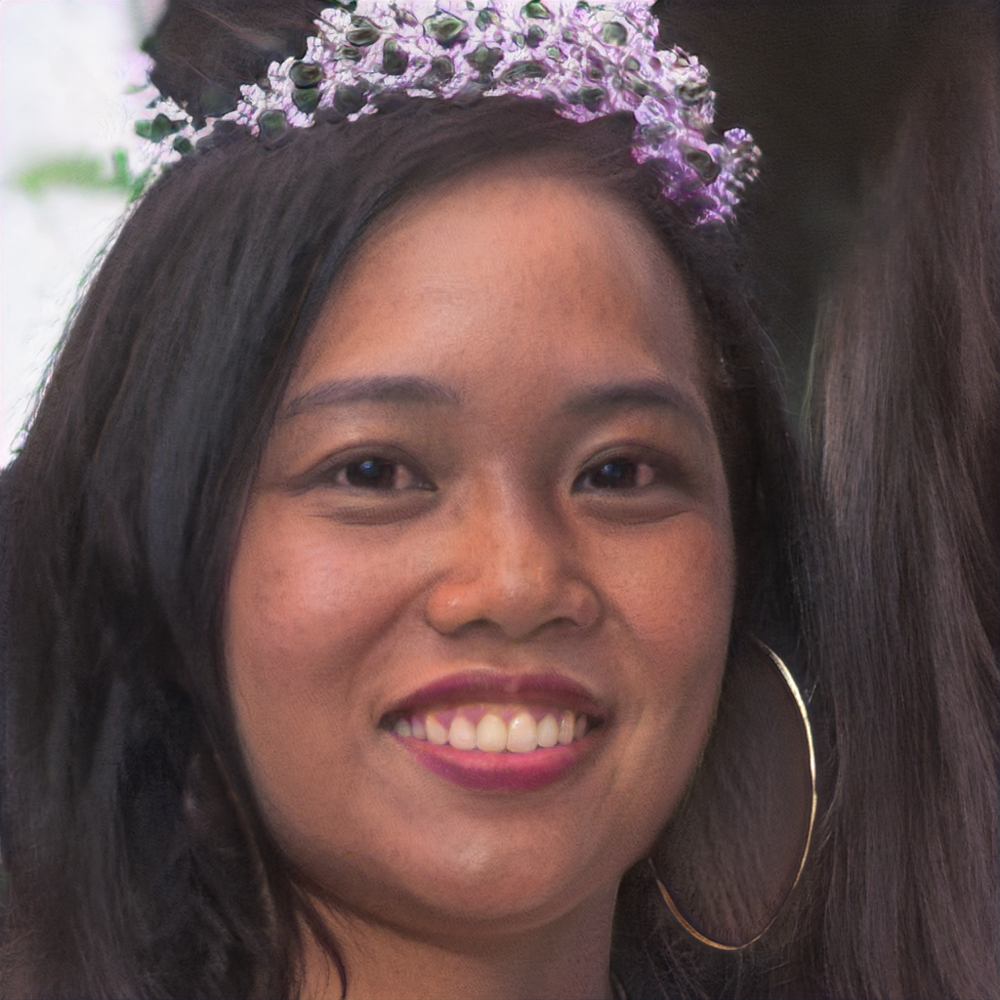

1 -0.2607904374599457 (0.3238157331943512, 0.05479294, 434.6550598144531, -0.32174819707870483)


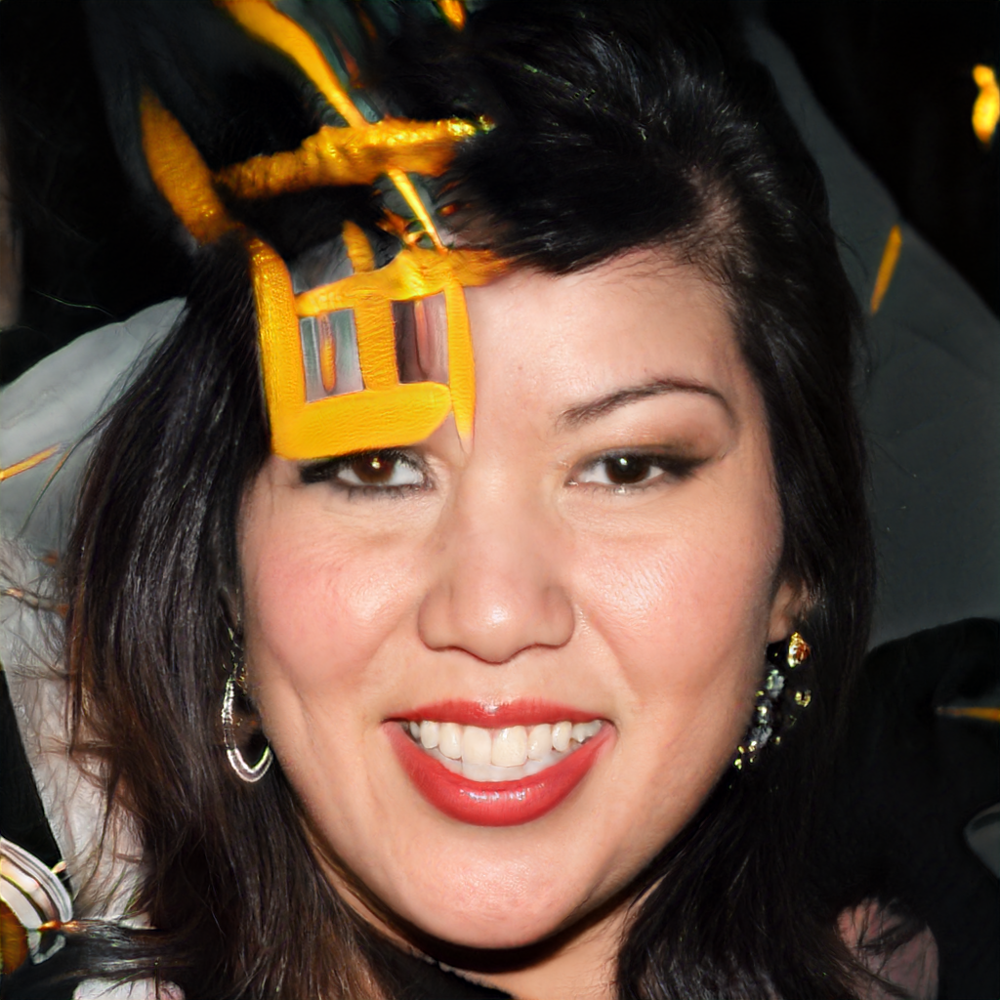

2 -0.2576461434364319 (0.3386000990867615, -0.8389562, 505.3211669921875, -0.3352937400341034)


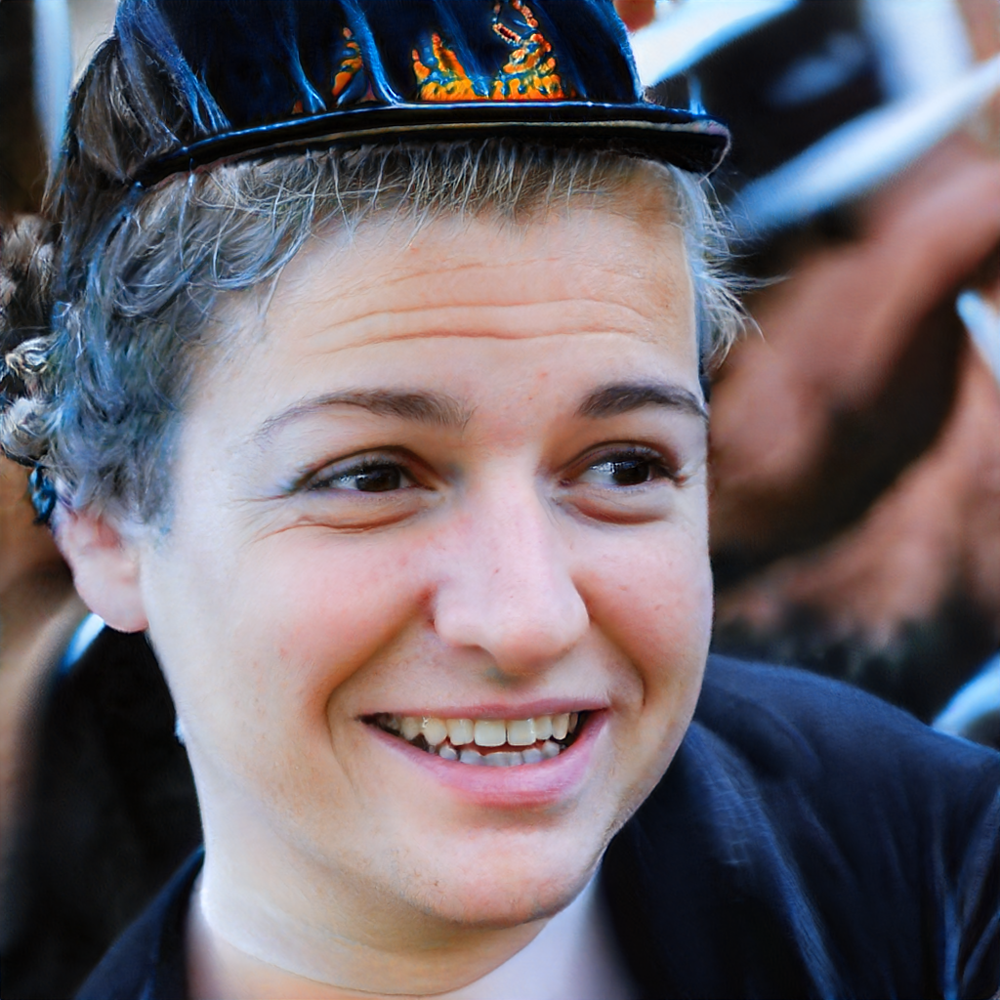

3 -0.25641679763793945 (0.32538971304893494, -1.8631456, 507.6529846191406, -0.3210477828979492)


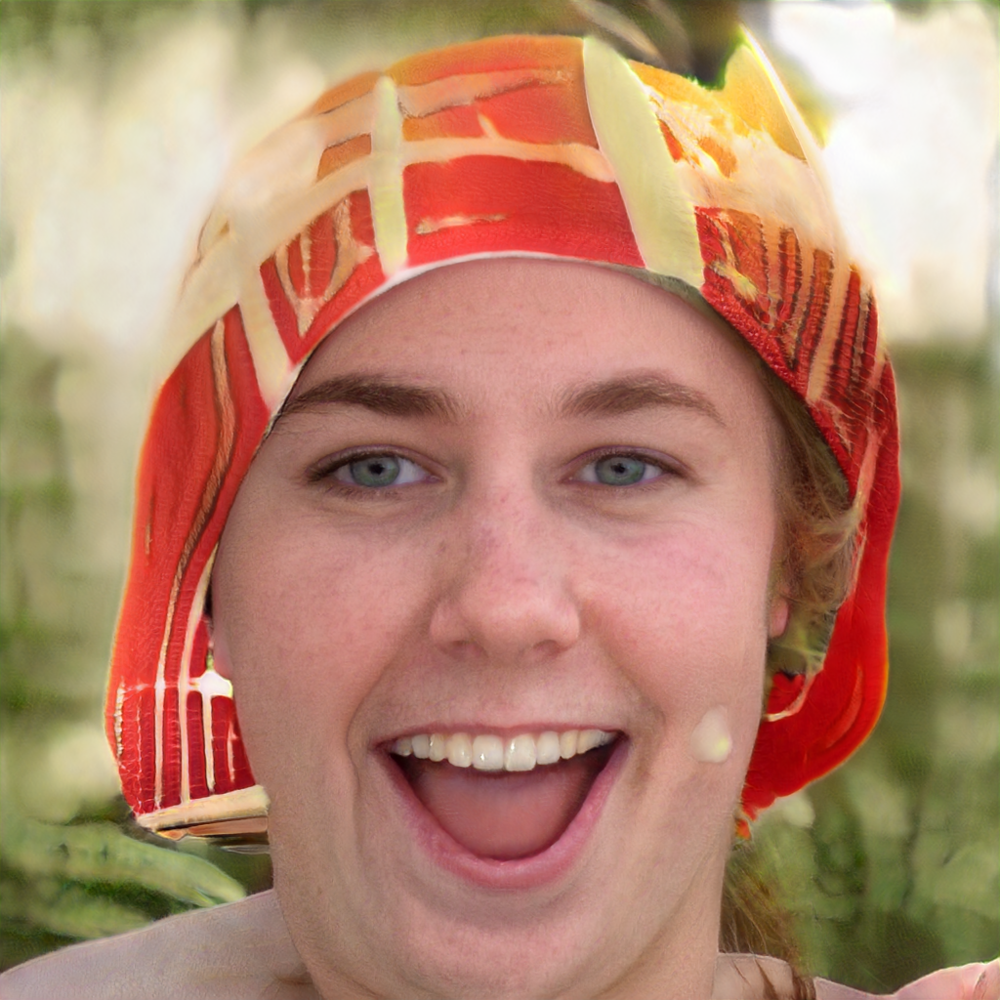

4 -0.25524604320526123 (0.3157564699649811, -1.1366172, 566.1714477539062, -0.31185534596443176)


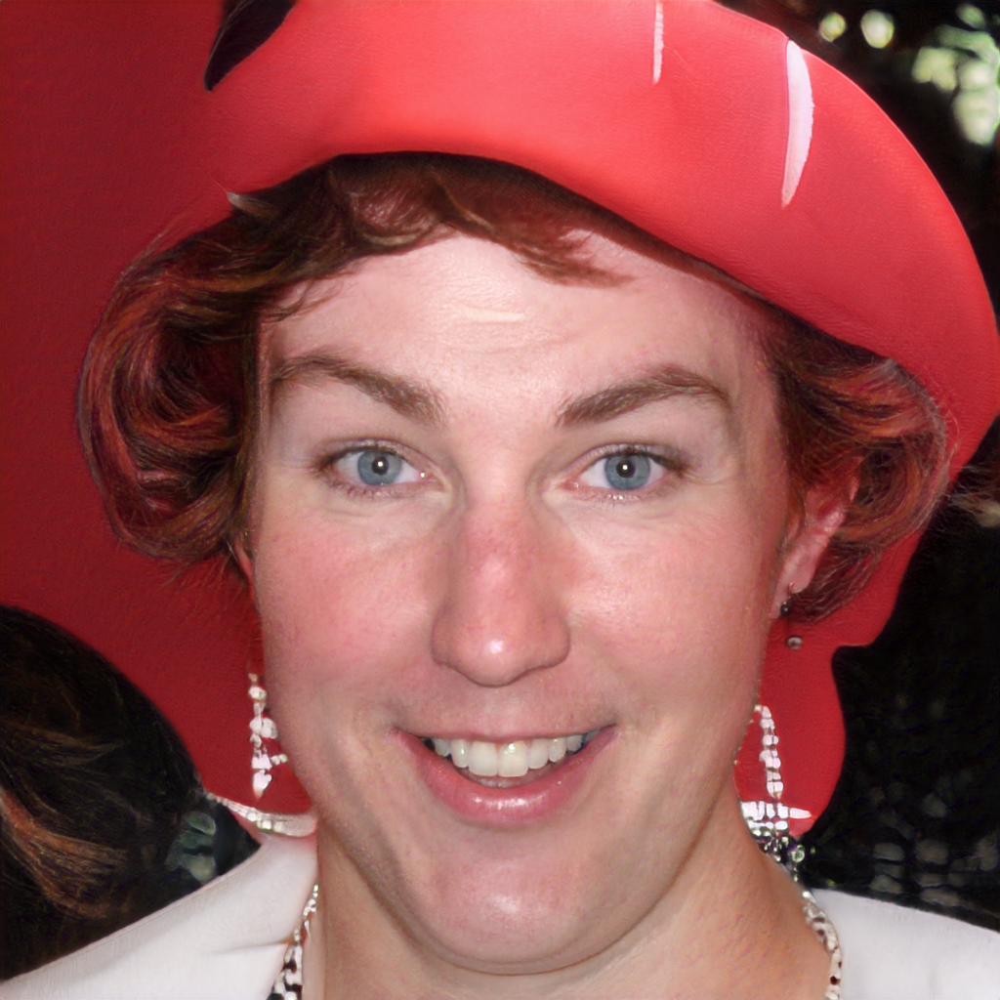

5 -0.25400134921073914 (0.3127630352973938, -2.6159427, 462.71246337890625, -0.3078877627849579)


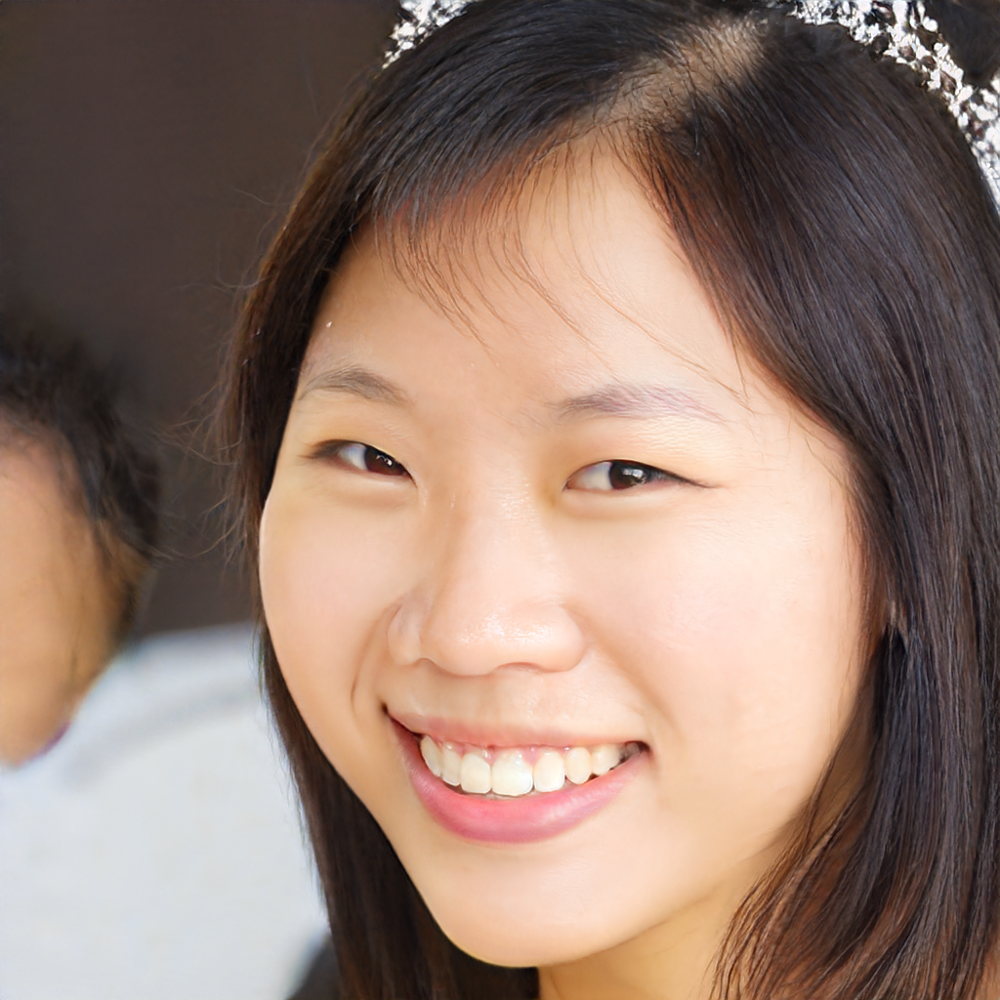

6 -0.25105342268943787 (0.3272639214992523, -1.45748, 495.1384582519531, -0.3233887851238251)


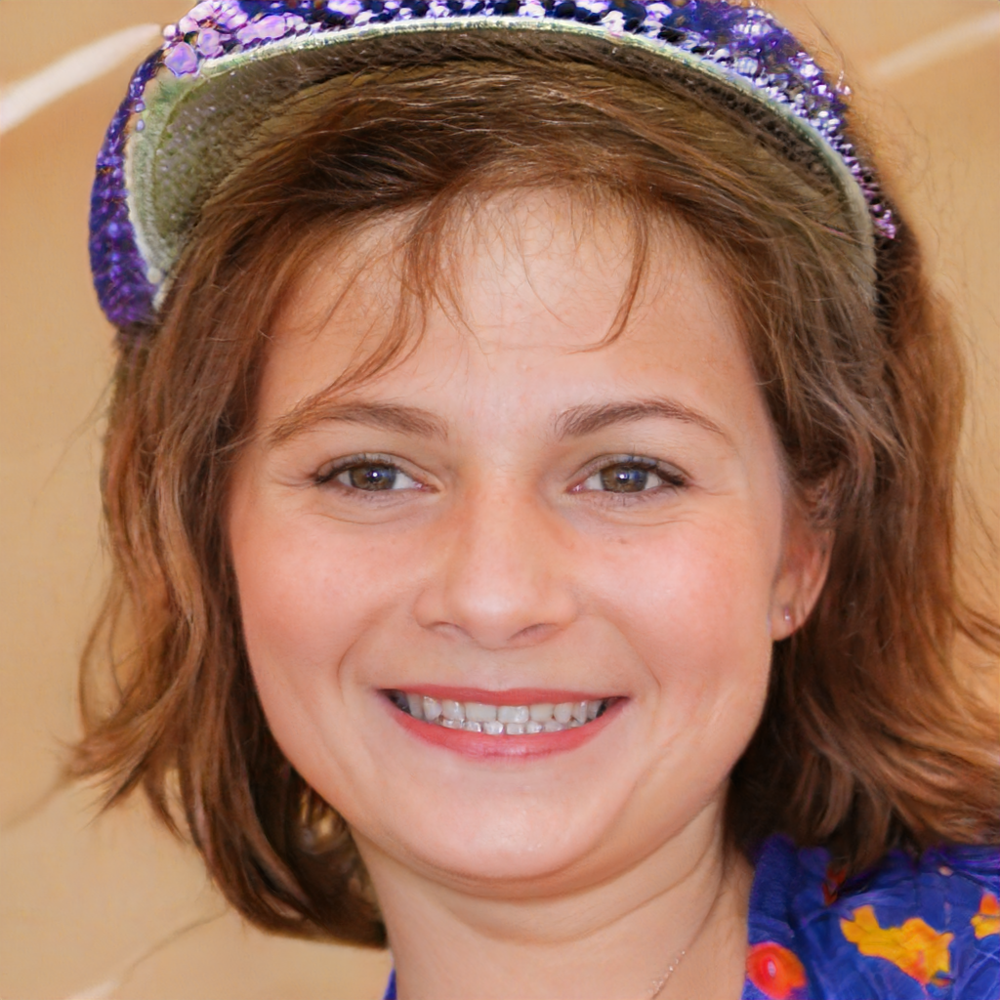

7 -0.25041645765304565 (0.29546692967414856, -1.8329546, 485.8211975097656, -0.29126179218292236)


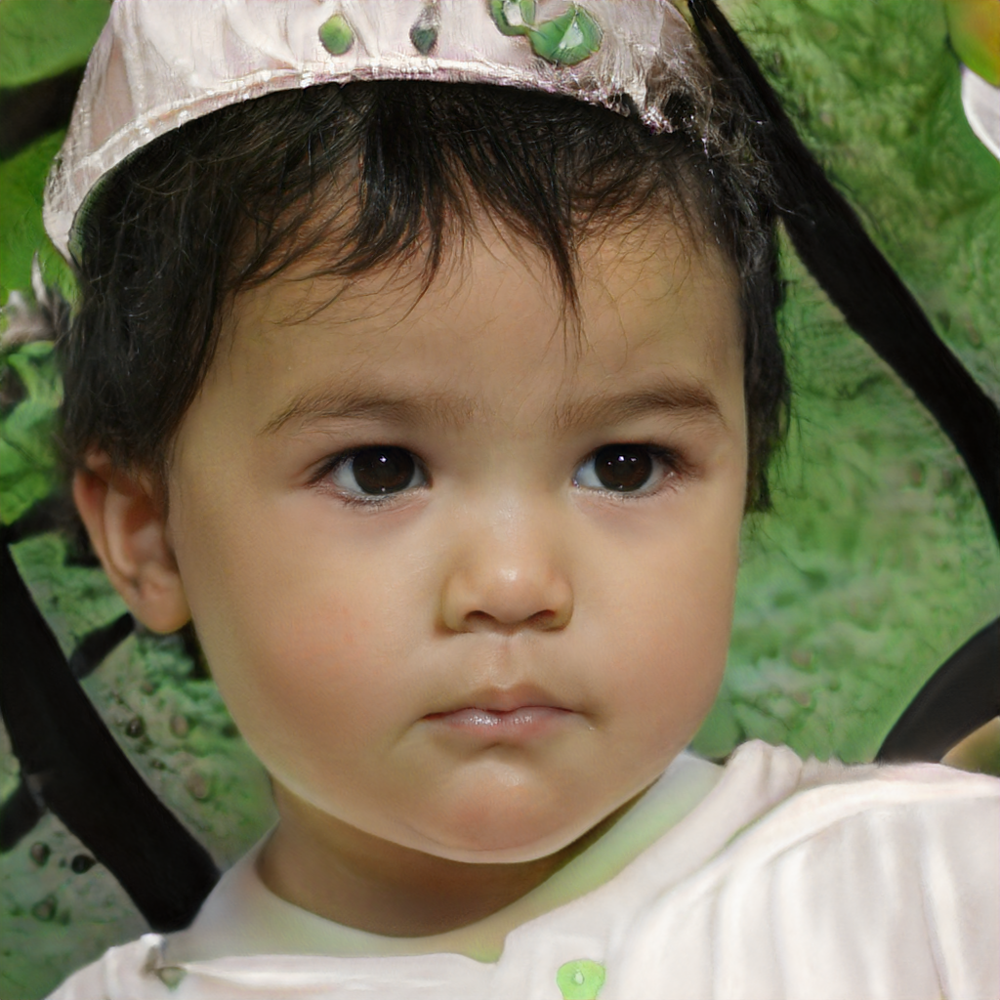

8 -0.2498336136341095 (0.3323397636413574, -1.5808852, 505.85699462890625, -0.32828888297080994)


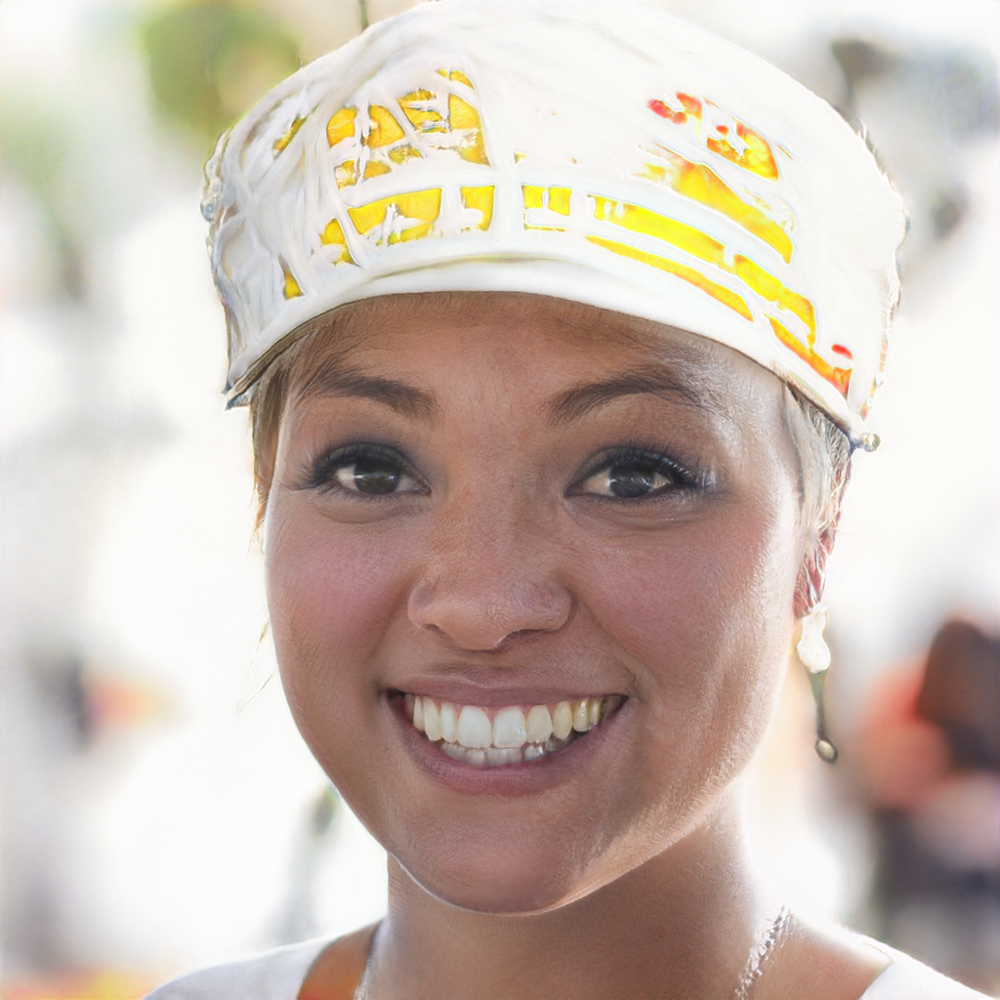

9 -0.24913933873176575 (0.3215407431125641, -2.2429397, 485.69696044921875, -0.3169262409210205)


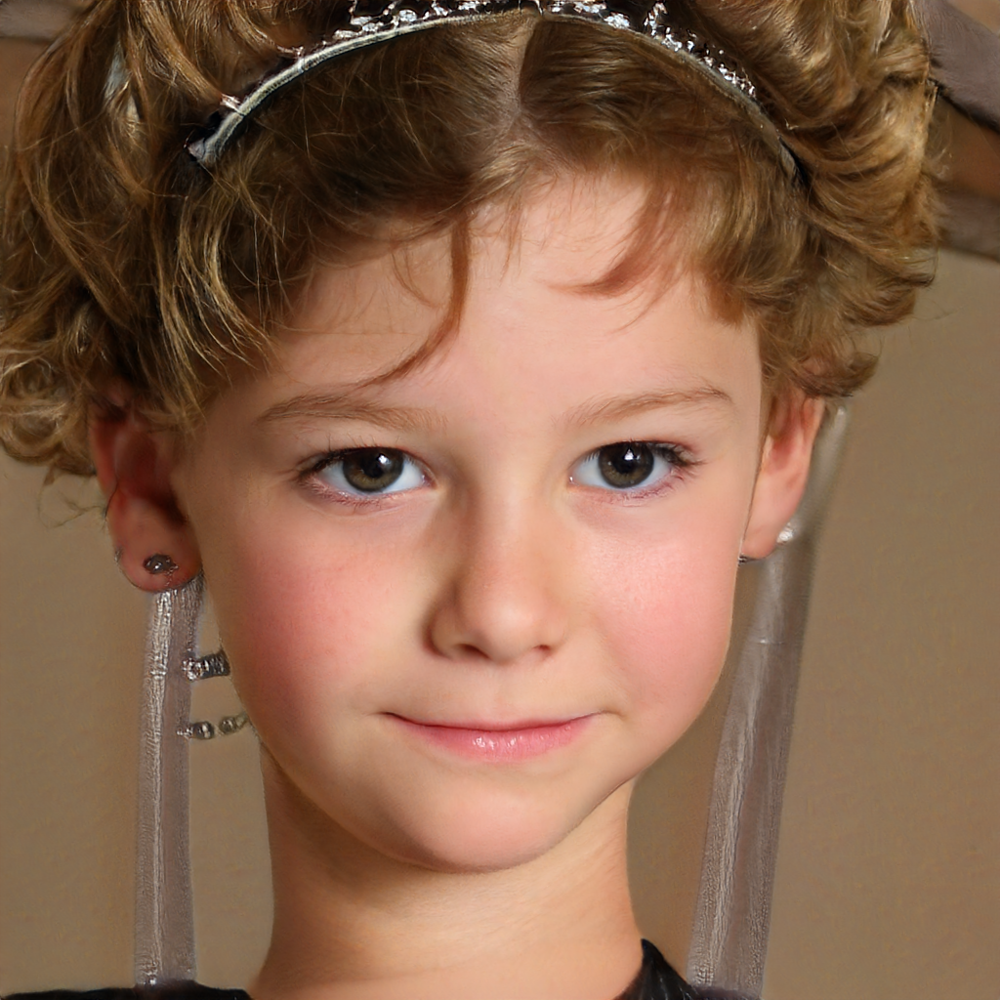

In [ ]:
results=searchAndClimb("a queen wearing a crown", n=1000, k=10, t=1000, show=True)

In [ ]:
def displayLatent(latent,phi=1.0):
    with torch.no_grad():
        img_pt, _ = g(
            [torch.from_numpy(latent).to(device)],
            truncation=phi,
            truncation_latent=latent_avg.to(device),
            randomize_noise=False,
        )
    img=img_pt.cpu().numpy()[0]
    return fmtImg(img)

In [ ]:
def showResults(results):
    img = PIL.Image.fromarray(np.hstack([np.array(displayLatent(r)) for (r,s) in results]), 'RGB')
    return img

In [ ]:
results=searchAndClimb("a photo of men with green hairs",1000,10,100)
showResults(results)